# Example of usage

## TO DO
 - ~~Read https://ieeexplore.ieee.org/stamp/stamp.jsp?tp=&arnumber=6080751~~ 
 - ~~Implement Spectral Angle Metric~~
 - ~~Fix: Images are being read in an improper order depending on code~~
 - ~~Test different pixel formats~~
 - ~~Implement uint16 to uint10le and backwards: Let's just use np.uint16 and make sure that numbers don't exceed the maximum of 10/12 bits!!~~
 - ~~Implement planar support~~
 - ~~Implement rgb to bgr, etc.~~
 - Download and assess ERA5 / Other high-res climate datasets:
   - https://deepesdl.readthedocs.io/en/latest/datasets/ESDC/
   - ~~https://weatherbench2.readthedocs.io/en/latest/data-guide.html#era5~~
   - ~~https://github.com/google-research/arco-era5~~
 - Improve satalign
 - Create function to create a compression recipe automatically from a cube
 - ~~Try KLT (Karhunen-Loève Transform, also known as PCA before compressing~~
 - ~~Implement automatic channel fusion, when the data has more than 1 extra dimension~~
 - Add baseline curves: 
   - JPEG (image per image) KLT + JPEG: Should just mean using this `-c:v mpeg2video -g 1`
   - Frame-by-frame jpeg 2000 `-c:v jpeg2000 output_%04d.jp2` or better: `-c:v jpegxl output_%04d.jxl`
   - With / without cloud-filling; with / without alignment
 - ~~Finish quick implementation and use SSIM / FSIM for the plots: https://www4.comp.polyu.edu.hk/~cslzhang/IQA/TIP_IQA_FSIM.pdf~~
 - ~~Add MS-SSIM for the plots: https://lightning.ai/docs/torchmetrics/stable/image/multi_scale_structural_similarity.html~~
 - Write paper: A library for hyperspectral spatio-temporal imagery compression with standard video codecs
 
## Others
 - Read more literature: 
   - https://ietresearch.onlinelibrary.wiley.com/doi/full/10.1049/ipr2.12077
 - For complex input formats (e.g. yuv444p, etc.) do ffv1 as intermediate format! > Could fix our vp9 for yuva444p10le problems

In [1]:
#Autoreload .py files
%load_ext autoreload
%autoreload 2

#https://github.com/chmp/ipytest/issues/80
import sys
sys.breakpointhook = sys.__breakpointhook__

Load required libraries

In [2]:
import xarray as xr
import numpy as np
from pathlib import Path
from xarrayvideo import xarray2video, video2xarray, gap_fill, plot_image, to_netcdf
import matplotlib.pyplot as plt

/home/oscar/.conda/envs/xarrayvideo/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


Set up some variables and load an example minicube

In [3]:
array_id= '-111.49_38.60'
input_path= '../mc_-111.49_38.60_1.2.2_20230702_0.zarr'
output_path= './out'
use_B07= True

In [4]:
minicube= xr.open_dataset(input_path, engine='zarr')
minicube['SCL']= minicube['SCL'].astype(np.uint8) #Fixes problem with the dataset
minicube['cloudmask_en']= minicube['cloudmask_en'].astype(np.uint8)
if not use_B07: minicube= minicube.drop_vars('B07') #We drop a variable for now

In [5]:
minicube

<xarray.Dataset> Size: 471MB
Dimensions:       (time: 495, y: 128, x: 128, event_time: 2192, y_300: 9,
                   x_300: 9)
Coordinates:
  * event_time    (event_time) datetime64[ns] 18kB 2016-01-01 ... 2021-12-31
  * time          (time) datetime64[ns] 4kB 2016-01-03T12:00:00 ... 2022-10-0...
  * x             (x) float64 1kB 9.787e+05 9.787e+05 ... 9.812e+05 9.812e+05
  * x_300         (x_300) float64 72B 9.785e+05 9.788e+05 ... 9.809e+05
  * y             (y) float64 1kB 4.288e+06 4.288e+06 ... 4.285e+06 4.285e+06
  * y_300         (y_300) float64 72B 4.288e+06 4.287e+06 ... 4.285e+06
Data variables: (12/38)
    B02           (time, y, x) float64 65MB ...
    B03           (time, y, x) float64 65MB ...
    B04           (time, y, x) float64 65MB ...
    B05           (time, y, x) float64 65MB ...
    B06           (time, y, x) float64 65MB ...
    B07           (time, y, x) float64 65MB ...
    ...            ...
    t2m_max       (time) float32 2kB ...
    t2m_mean      (time) float32 2kB ...
    t2m_min       (time) float32 2kB ...
    tp_max        (time) float32 2kB ...
    tp_mean       (time) float32 2kB ...
    tp_min        (time) float32 2kB ...
Attributes: (12/27)
    Conventions:               CF-1.7
    base_minicube:             deepextremes-minicubes/1.1.p/mc_-111.49_38.60_...
    base_version:              1.1.p
    changes:                   https://github.com/bcdev/deepextremes/minicube...
    creation_date:             2023-06-18 01:58:08
    data_id:                   mc_-111.49_38.60_1.2.2_20230702_0
    ...                        ...
    time_coverage_resolution:  P5DT0H0M0S
    time_coverage_start:       2016-01-01T00:00:00+00:00
    time_period:               5D
    time_range:                ['2016-01-01', '2022-10-10']
    title:                     Minicube at -111.49 38.60
    version:                   1.2.2

Fix the small jitter betweeen timesteps to improve compression

/home/oscar/satalign/satalign/pcc.py:79: UserWarning: Could not determine RMS error between images with the normalized average intensities 9649194.526800724 and 0.0. Either the reference or moving image may be empty.
  shift, error, diffphase = phase_cross_correlation(
/home/oscar/satalign/satalign/main.py:240: UserWarning: Estimated translation is too large
  warnings.warn("Estimated translation is too large")


(<Figure size 1000x1000 with 1 Axes>, <Axes: >)

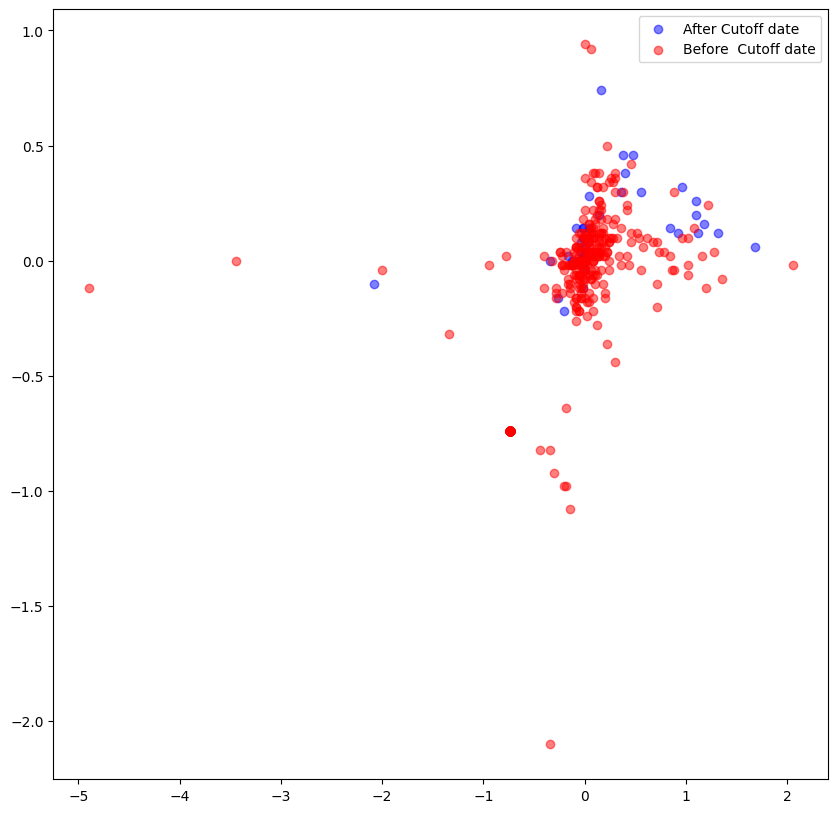

In [6]:
import satalign, satalign.ecc, satalign.pcc

#Reload minicube for testing
minicube= xr.open_dataset(input_path, engine='zarr')
minicube['SCL']= minicube['SCL'].astype(np.uint8) #Fixes problem with the dataset
if not use_B07: minicube= minicube.drop_vars('B07') #We drop a variable for now

bands= ['B04','B03','B02','B8A','B06','B05'] + (['B07'] if use_B07 else [])
reference_image= minicube[bands].isel(time=slice(74,None)).mean("time").to_array().transpose('variable', 'y', 'x')
datacube= minicube[bands].to_array().transpose('time', 'variable', 'y', 'x')

syncmodel= satalign.pcc.PCC( #PCC quicker, ECC more precise
    datacube=datacube, # T x C x H x W
    reference=reference_image, # C x H x W
    channel="mean", crop_center=96, num_threads=1)
new_cube, warps= syncmodel.run_multicore()

#Plot scatter plot
warp_df = satalign.utils.warp2df(warps, datacube.time.values)
satalign.utils.plot_s2_scatter(warp_df)

#Copy back
# for b in bands: minicube[b]= new_cube.sel(variable=b)

In [7]:
# satalign.utils.plot_profile(
#     warped_cube=new_cube.values,
#     raw_cube=datacube.values,
#     x_axis=3,
#     rgb_band=[0,1,2],
#     intensity_factor=1.,
#     figsize= (7,10)
# )
# plt.show()

Gap-fill in clouds

For now, we won't apply gap-filling of the clouds, since it is too big of a change to the data. If a good gap-filling algorithm were to be used, we could save up much more space when converting to video

In [8]:
#Perform the gap filling. Three methods: last_value, interp_forward, interp (non-causal!!)
minicube_filled= gap_fill(minicube, fill_bands=bands, mask_band='cloudmask_en',
                          fill_values=[1, 3, 4], method='last_value', new_mask='invalid', 
                          coord_names=('time', 'variable', 'y', 'x'))

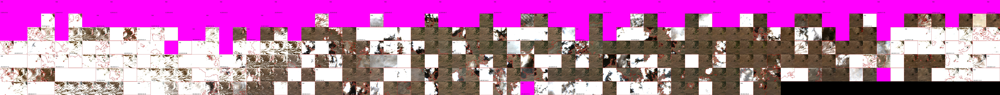

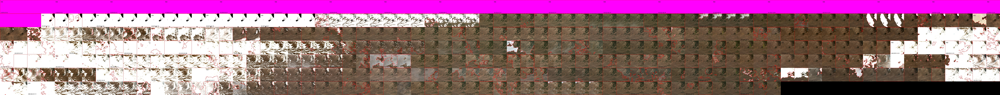

In [9]:
#RGB orig
plot_image(minicube, ['B04','B03','B02'], mask_name='cloudmask_en', save_name='./out/RGB original.jpg')

#RGB gap-filled
plot_image(minicube_filled, ['B04','B03','B02'], mask_name='invalid', save_name='./out/RGB gap-filled.jpg')

In [10]:
minicube

<xarray.Dataset> Size: 471MB
Dimensions:       (time: 495, y: 128, x: 128, event_time: 2192, y_300: 9,
                   x_300: 9)
Coordinates:
  * event_time    (event_time) datetime64[ns] 18kB 2016-01-01 ... 2021-12-31
  * time          (time) datetime64[ns] 4kB 2016-01-03T12:00:00 ... 2022-10-0...
  * x             (x) float64 1kB 9.787e+05 9.787e+05 ... 9.812e+05 9.812e+05
  * x_300         (x_300) float64 72B 9.785e+05 9.788e+05 ... 9.809e+05
  * y             (y) float64 1kB 4.288e+06 4.288e+06 ... 4.285e+06 4.285e+06
  * y_300         (y_300) float64 72B 4.288e+06 4.287e+06 ... 4.285e+06
Data variables: (12/38)
    B02           (time, y, x) float64 65MB 0.0 0.0 0.0 ... 0.0549 0.0648 0.0646
    B03           (time, y, x) float64 65MB 0.0 0.0 0.0 ... 0.0724 0.0817 0.083
    B04           (time, y, x) float64 65MB 0.0 0.0 0.0 ... 0.0893 0.1026 0.1059
    B05           (time, y, x) float64 65MB 0.0 0.0 0.0 ... 0.1084 0.1216 0.1241
    B06           (time, y, x) float64 65MB 0.0 0.0 0.0 ... 0.131 0.1457 0.1439
    B07           (time, y, x) float64 65MB 0.0 0.0 0.0 ... 0.1483 0.1573 0.1538
    ...            ...
    t2m_max       (time) float32 2kB ...
    t2m_mean      (time) float32 2kB ...
    t2m_min       (time) float32 2kB ...
    tp_max        (time) float32 2kB ...
    tp_mean       (time) float32 2kB ...
    tp_min        (time) float32 2kB ...
Attributes: (12/27)
    Conventions:               CF-1.7
    base_minicube:             deepextremes-minicubes/1.1.p/mc_-111.49_38.60_...
    base_version:              1.1.p
    changes:                   https://github.com/bcdev/deepextremes/minicube...
    creation_date:             2023-06-18 01:58:08
    data_id:                   mc_-111.49_38.60_1.2.2_20230702_0
    ...                        ...
    time_coverage_resolution:  P5DT0H0M0S
    time_coverage_start:       2016-01-01T00:00:00+00:00
    time_period:               5D
    time_range:                ['2016-01-01', '2022-10-10']
    title:                     Minicube at -111.49 38.60
    version:                   1.2.2

Since we are basically using `ffmpeg` for the enconding, here are some important commands

In [11]:
#!ffmpeg -codecs

In [12]:
#Get info of a particular encoder
!ffmpeg -h encoder=jpeg2000 -v quiet #vp9, libx264, libx265, ffv1, prores_ks, dnxhd

Encoder jpeg2000 [JPEG 2000]:
    General capabilities: none
    Threading capabilities: none
    Supported pixel formats: rgb24 yuv444p gray yuv420p yuv422p yuv410p yuv411p pal8 rgb48le gray16le
jpeg 2000 encoder AVOptions:
  -format            <int>        E..V....... Codec Format (from 0 to 1) (default jp2)
     j2k             0            E..V.......
     jp2             1            E..V.......
  -tile_width        <int>        E..V....... Tile Width (from 1 to 1.07374e+09) (default 256)
  -tile_height       <int>        E..V....... Tile Height (from 1 to 1.07374e+09) (default 256)
  -pred              <int>        E..V....... DWT Type (from 0 to 1) (default dwt97int)
     dwt97int        0            E..V.......
     dwt53           0            E..V.......
  -sop               <int>        E..V....... SOP marker (from 0 to 1) (default 0)
  -eph               <int>        E..V....... EPH marker (from 0 to 1) (default 0)
  -prog              <int>        E..V....... Progression O

Compress and write new file

If you get `ContainsGroupError`, make sure to delete the existing `out` folder:

In [13]:
#Remove out folder to avoid errors
!rm -rf ./out

Define conversion rules for the different bands. The syntax is:
```
{
 'video_name_1': ( 
    var or (var1, var2, var3), #Variables present in the xarray
    (t_coord_name, x_coord_name, y_coord_name), #Names of the coordinates in order (t, x, y)
    [Optional] n_components: 0 or n_components 
        - 0: store all bands in sets of 3 channels, last video might only have 1 or 2 channels (less efficient)
        - n_components: store all bands using n_components, which must be divisable by 3
    [Optional] compression parameters dictionary:  
       {
        'c:v': 'libx265',  #[libx264, libx265, vp9, ffv1]
        'preset': 'medium',  #Preset for quality/encoding speed tradeoff: quick, medium, slow (better)
        'crf': 3, #3 default, the lower, the higher the quality
        'x265-params': 'qpmin=0:qpmax=5:psy-rd=0:psy-rdoq=0' #qpmax controls the quality when crf is 0
       },
    [Optional] number of bits (e.g.: 8,10,12,16),
    ),
 'video_name_2': etc
}
```

In [98]:
#TODO: 
# improve sataling
# improve metrics efficiency (join all metrics into a single function call to use pytorch for everything?)

In [15]:
#Save original minicube for comparing the size (it will be compressed)
Path(output_path).mkdir(exist_ok=True, parents=True)
#minicube.to_zarr(Path(output_path) / f'{array_id}.zarr')
to_netcdf(minicube, Path(output_path) / f'{array_id}.nc')

In [99]:
#Define the output video encoding parameters.

#Video lossless
#Best for lossless 1-channel: ffv1
lossless_params= { 'c:v':'ffv1' }
#Best for lossless 3-channel: vp9
# lossless_params= {'c:v':'vp9', 'lossless':1, 'deadline':'good'} #good, best, realtime

#Video lossy 
#Best for lossy 3-channel: libx265, 12 bits
#Psychovisual Rate-Distortion Optimization (Psy-RD) is a technique used in video encoding 
#that adjusts the bit allocation and quantization to improve the perceived visual quality 
#of the encoded video. This method takes into account the human visual system's sensitivity 
#to different types of distortions and allocates more bits to areas that are more noticeable 
#to the human eye, such as edges and textures, while compressing other areas more aggressively
# -> We disable those optimizations!
lossy_params= {
    'c:v': 'libx265',  #[libx264, libx265, vp9, ffv1] #Test: -c:v jpegxl output_%04d.jxl
    'preset': 'medium',  #Preset for quality/encoding speed tradeoff: quick, medium, slow (better)
    'crf': [1], #14 default, 11 for higher quality and size
    # 'tune': 'ssim', #ssim, psnr
    # 'x265-params': 'no-sao:selective-sao=0',
    'x265-params': ['qpmin=0:qpmax=0.1:psy-rd=0:psy-rdoq=0',
                    'qpmin=0:qpmax=1:psy-rd=0:psy-rdoq=0',   #When using a low qpmax, basically crf is 100% ignored
                    'qpmin=0:qpmax=10:psy-rd=0:psy-rdoq=0'], #Usually with crf=0 this is around 4-8, sot set higher to go <0
    # "lookahead-slices=1"
    #psy-rd=0:psy-rdoq=0
    }

#Image lossy / lossless
image_lossy_params= {
    'codec': 'JP2OpenJPEG',
    'QUALITY': '25', #100 for lossless, less than that for lossy
    # 'REVERSIBLE': 'YES',  #YES for lossless
    'YCBCR420':'NO',
    'WRITE_METADATA': 'NO'
    }

image_lossless_params= {
    'codec': 'JP2OpenJPEG',
    'QUALITY': '100', #100 for lossless, less than that for lossy
    'REVERSIBLE': 'YES',  #YES for lossless
    'YCBCR420':'NO',
    'WRITE_METADATA': 'NO'
    }

#Define conversion rules for the different bands
#We can manually choose how to compress the different bands
conversion_rules= {    
#     #Sets of 3 channels are the most efficient for lossy compression
    # 'rgb': ( ('B04','B03','B02'), ('time','x','y'), 0, lossy_params, 8), #[0, 0.4]
    # 'ir3': ( ('B8A','B06','B05'), ('time','x','y'), 0, lossy_params, 10),
    
#     #Compressing 1 channel lossy is not efficient, as it just repeats the channel 3 times
#     'r': ( 'B04', ('time','x','y'), 0, lossy_params, 10),
    
#     #Compressing 1,3, or 4 channels losslessly is efficient
#     'cm': ( 'cloudmask_en', ('time','x','y'), 0, lossless_params, 8),
#     'scl': ( 'SCL', ('time','x','y'), 0, lossless_params, 8),
    }
    
#There are also automatic modes for encoding many bands at once
conversion_rules= {
#     #We can do PCA and keep a subset of principal components (e.g. 6)
    # 'all': ( ('B07', 'B06','B05','B04','B03','B02','B8A'), ('time','x','y'), 6, lossy_params, 10),
    
    # We can pass all the bands, NOT do PCA, and repeat any bands if needed so that they are divisible by 3
    'all2': ( ('B07','B06','B05','B04','B03','B02','B8A'), ('time','x','y'), 0, image_lossy_params, 16),
    
    # Compressing 1,3, or 4 channels losslessly is efficient
    'scl': ( 'SCL', ('time','x','y'), 0, image_lossless_params, 8),
    'cm': ( 'cloudmask_en', ('time','x','y'), 0, image_lossless_params, 8),
    }

100%|██████████| 495/495 [00:19<00:00, 25.55it/s]


all2: 433.12Mb -> ['0.05', '0.00', '0.05', '0.00', '0.05', '0.00', '0.05', '0.00', '0.05', '0.00']Mb (showing last 10)(4.64% of original size, 2.9720 bpppb) in 19.41s
 - params={'codec': 'JP2OpenJPEG', 'QUALITY': '25', 'YCBCR420': 'NO', 'WRITE_METADATA': 'NO'}


100%|██████████| 495/495 [00:09<00:00, 51.51it/s]


 - Decompression time 9.64s


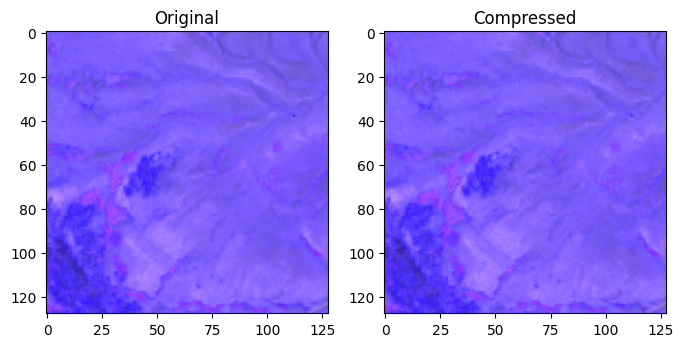

Saturation values per band ('B07', 'B06', 'B05', 'B04', 'B03', 'B02', 'B8A')):
 [[0.     1.5684]
 [0.     1.5788]
 [0.     1.5902]
 [0.     1.6066]
 [0.     1.663 ]
 [0.     1.7368]
 [0.     1.5559]]
 - MSE_sat 0.000010 (input saturated)
 - SNR_sat 42.5734 (input saturated)
 - PSNR_sat 54.6562 (input saturated)
 - Exp. SA 0.0114 (input saturated)


100%|██████████| 495/495 [00:12<00:00, 40.24it/s]


scl: 7.73Mb -> ['0.00', '0.00', '0.00', '0.00', '0.00', '0.00', '0.00', '0.00', '0.00', '0.00']Mb (showing last 10)(9.95% of original size, 0.7961 bpppb) in 12.31s
 - params={'codec': 'JP2OpenJPEG', 'QUALITY': '100', 'REVERSIBLE': 'YES', 'YCBCR420': 'NO', 'WRITE_METADATA': 'NO'}


100%|██████████| 495/495 [00:08<00:00, 61.67it/s]


 - Decompression time 8.03s


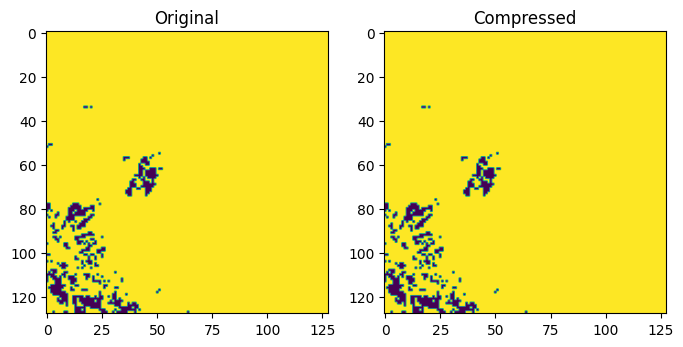

 - acc 1.00


100%|██████████| 495/495 [00:12<00:00, 38.82it/s]


cm: 7.73Mb -> ['0.00', '0.00', '0.00', '0.00', '0.00', '0.00', '0.00', '0.00', '0.00', '0.00']Mb (showing last 10)(5.77% of original size, 0.4613 bpppb) in 12.76s
 - params={'codec': 'JP2OpenJPEG', 'QUALITY': '100', 'REVERSIBLE': 'YES', 'YCBCR420': 'NO', 'WRITE_METADATA': 'NO'}


100%|██████████| 495/495 [00:08<00:00, 59.83it/s]


 - Decompression time 8.28s


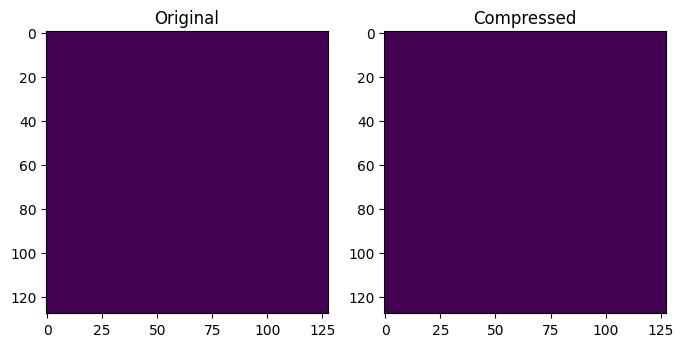

 - acc 1.00


In [100]:
#Run with compute_stats (takes a bit longer). Activating `use_ssim` takes even longer
arr_dict= xarray2video(minicube, array_id, conversion_rules, fmt='auto',
                       output_path=output_path, use_ssim=False, compute_stats=True,
                       loglevel='verbose', #verbose, quiet
                       save_dataset= True
                       )  

In [101]:
#!ffprobe -v error -show_format -show_streams out/-111.49_38.60/all2_001.mkv

Compute total size, and observe a signficant compression rate (~25x)

In [102]:
original_path= str(Path(output_path) / f'{array_id}.nc')
!du -h {original_path} -d0

254M	out/-111.49_38.60.nc


In [103]:
new_path= str(Path(output_path) / f'{array_id}')
!du -h {new_path} 

27M	out/-111.49_38.60


Read again the written file, and check that everything has persisted

In [104]:
minicube_new= video2xarray(output_path, array_id) 
minicube_new

100%|██████████| 495/495 [00:08<00:00, 61.07it/s]


<xarray.Dataset> Size: 244MB
Dimensions:       (y: 128, x: 128, time: 495, event_time: 2192, y_300: 9,
                   x_300: 9)
Coordinates:
  * event_time    (event_time) datetime64[ns] 18kB 2016-01-01 ... 2021-12-31
  * time          (time) datetime64[ns] 4kB 2016-01-03T12:00:00 ... 2022-10-0...
  * x             (x) float64 1kB 9.787e+05 9.787e+05 ... 9.812e+05 9.812e+05
  * x_300         (x_300) float64 72B 9.785e+05 9.788e+05 ... 9.809e+05
  * y             (y) float64 1kB 4.288e+06 4.288e+06 ... 4.285e+06 4.285e+06
  * y_300         (y_300) float64 72B 4.288e+06 4.287e+06 ... 4.285e+06
Data variables: (12/38)
    cop_dem       (y, x) float64 131kB ...
    crs_300       int64 8B ...
    e_max         (time) float32 2kB ...
    e_mean        (time) float32 2kB ...
    e_min         (time) float32 2kB ...
    event_labels  (event_time) uint16 4kB ...
    ...            ...
    B04           (time, x, y) float32 32MB 0.0 0.0 0.0 ... 0.1051 0.1051 0.1051
    B03           (time, x, y) float32 32MB 0.0 0.0 0.0 ... 0.0812 0.0812 0.0812
    B02           (time, x, y) float32 32MB 0.0 0.0 0.0 ... 0.06276 0.06615
    B8A           (time, x, y) float32 32MB 0.0 0.0 0.0 ... 0.1656 0.1656 0.1656
    SCL           (time, x, y) uint8 8MB 0 0 0 0 0 0 0 0 0 ... 5 5 5 5 5 5 5 5 5
    cloudmask_en  (time, x, y) uint8 8MB 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0 0
Attributes: (12/27)
    Conventions:               CF-1.7
    base_minicube:             deepextremes-minicubes/1.1.p/mc_-111.49_38.60_...
    base_version:              1.1.p
    changes:                   https://github.com/bcdev/deepextremes/minicube...
    creation_date:             2023-06-18 01:58:08
    data_id:                   mc_-111.49_38.60_1.2.2_20230702_0
    ...                        ...
    time_coverage_resolution:  P5DT0H0M0S
    time_coverage_start:       2016-01-01T00:00:00+00:00
    time_period:               5D
    time_range:                ['2016-01-01', '2022-10-10']
    title:                     Minicube at -111.49 38.60
    version:                   1.2.2

Visualize results

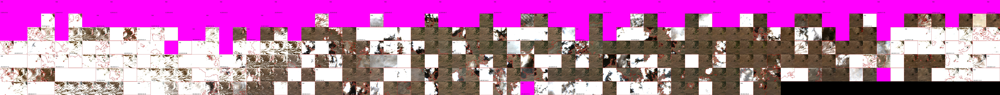

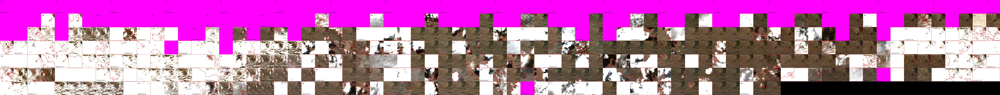

In [97]:
#RGB
plot_image(minicube, ['B04','B03','B02'], save_name='./out/RGB original.jpg')
plot_image(minicube_new, ['B04','B03','B02'], save_name='./out/RGB compressed.jpg')

In [ ]:
#R3
plot_image(minicube, ['B8A','B06','B05'], save_name='./out/R3 original.jpg')
plot_image(minicube_new, ['B8A','B06','B05'], save_name='./out/R3 compressed.jpg')

In [ ]:
#Cloudmask
plot_image(minicube, ['cm'], plot_idx=[[0]], save_name='./out/CM original.jpg')
plot_image(minicube_new, ['cm'], plot_idx=[[0]], save_name='./out/CM compressed.jpg')

In [ ]:
#Gray
# plot_image(minicube, ['B07'], plot_idx=[[0]], save_name='./out/Gray original.jpg')
# plot_image(minicube_new, ['B07'], plot_idx=[[0]], save_name='./out/Gray compressed.jpg')

In [ ]:
#RGBA
# plot_image(minicube, ['B8A','B07','B06','B05'], plot_idx=[[0],[1],[2],[3]], save_name='RGBA original.jpg')
# plot_image(minicube_new, ['B8A','B07','B06','B05'], plot_idx=[[0],[1],[2],[3]], save_name='RGBA compressed.jpg')
# txy_real_rgba_compressed= np.transpose(arr_dict['ir4'][0], (3,0,1,2)) #t,x,y,3 -> 4,t,x,y

Watch as a video (some formats might not be supported)

In [ ]:
from IPython.display import Video, display, HTML, Image
for video in conversion_rules.keys():
    path= Path(output_path) / array_id / f'{video}.mkv'
    display(HTML(f'<h4>{video}</h4>{path}'))
    # display(HTML(f"""
    # <video width="512" height="512" controls>
    #   <source src="{path}">
    # </video>
    # """))
    display(Video(path, width=512, height=512, embed=True))

In [ ]:
assert False

## Use for climate data

In [30]:
# era5_version= '1959-2023_01_10-full_37-1h-0p25deg-chunk-1.zarr' #623Tb
era5_version= '1959-2023_01_10-wb13-6h-1440x721_with_derived_variables.zarr' #80Tb
# era5_version= '1959-2023_01_10-6h-240x121_equiangular_with_poles_conservative.zarr' #2Tb
# era5_version= '1959-2023_01_10-6h-64x32_equiangular_conservative.zarr' #163Gb

In [32]:
era5= xr.open_zarr(f'gs://weatherbench2/datasets/era5/{era5_version}') 
print(f'Size: {era5.nbytes / 2**30:.3f}Gb')
era5

[autoreload of fsspec.spec failed: Traceback (most recent call last):
  File "/home/oscar/.conda/envs/xarrayvideo/lib/python3.10/site-packages/IPython/extensions/autoreload.py", line 261, in check
    superreload(m, reload, self.old_objects)
  File "/home/oscar/.conda/envs/xarrayvideo/lib/python3.10/site-packages/IPython/extensions/autoreload.py", line 484, in superreload
    update_generic(old_obj, new_obj)
  File "/home/oscar/.conda/envs/xarrayvideo/lib/python3.10/site-packages/IPython/extensions/autoreload.py", line 381, in update_generic
    update(a, b)
  File "/home/oscar/.conda/envs/xarrayvideo/lib/python3.10/site-packages/IPython/extensions/autoreload.py", line 349, in update_class
    update_instances(old, new)
  File "/home/oscar/.conda/envs/xarrayvideo/lib/python3.10/site-packages/IPython/extensions/autoreload.py", line 307, in update_instances
    object.__setattr__(ref, "__class__", new)
TypeError: can't apply this __setattr__ to _Cached object
]


AttributeError: module 'fsspec' has no attribute 'core'

In [33]:
#Choose a subset of the dataset
import pandas as pd
start= '2022-07-01'
data_from_start_date= era5.sel(time=slice(pd.Timestamp(start), None))

#Save
#data_from_start_date.to_zarr(f'since_{start}_{era5_version}')

NameError: name 'era5' is not defined

In [34]:
import pandas as pd

#Open from local
era5_version= '../since_2022-07-01_1959-2023_01_10-wb13-6h-1440x721_with_derived_variables.zarr' #80Tb
era5_version= '../since_2022-07-01_2022-07-01_1959-2023_01_10-wb13-6h-1440x721_with_derived_variables.zarr'
# era5_version= '../1959-2023_01_10-6h-64x32_equiangular_conservative.zarr' #163Gb

era5= xr.open_dataset(era5_version, engine='zarr')
print(f'Size: {era5.nbytes / 2**30:.3f}Gb')
era5

Size: 687.364Gb


<xarray.Dataset> Size: 738GB
Dimensions:                                           (time: 776,
                                                       latitude: 721,
                                                       longitude: 1440,
                                                       level: 13)
Coordinates:
  * latitude                                          (latitude) float32 3kB ...
  * level                                             (level) int64 104B 50 ....
  * longitude                                         (longitude) float32 6kB ...
  * time                                              (time) datetime64[ns] 6kB ...
Data variables: (12/62)
    10m_u_component_of_wind                           (time, latitude, longitude) float32 3GB ...
    10m_v_component_of_wind                           (time, latitude, longitude) float32 3GB ...
    10m_wind_speed                                    (time, latitude, longitude) float32 3GB ...
    2m_dewpoint_temperature                           (time, latitude, longitude) float32 3GB ...
    2m_temperature                                    (time, latitude, longitude) float32 3GB ...
    above_ground                                      (time, level, latitude, longitude) float32 42GB ...
    ...                                                ...
    volumetric_soil_water_layer_1                     (time, latitude, longitude) float32 3GB ...
    volumetric_soil_water_layer_2                     (time, latitude, longitude) float32 3GB ...
    volumetric_soil_water_layer_3                     (time, latitude, longitude) float32 3GB ...
    volumetric_soil_water_layer_4                     (time, latitude, longitude) float32 3GB ...
    vorticity                                         (time, level, latitude, longitude) float32 42GB ...
    wind_speed                                        (time, level, latitude, longitude) float32 42GB ...

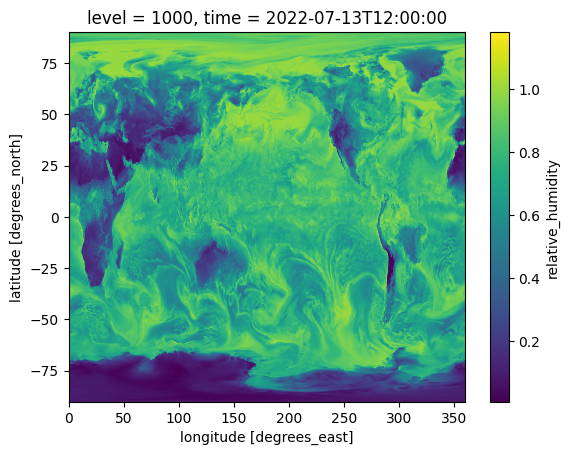

In [35]:
era5['relative_humidity'].isel({'time':50, 'level':12}).plot()

In [36]:
list(era5.variables)

['10m_u_component_of_wind',
 '10m_v_component_of_wind',
 '10m_wind_speed',
 '2m_dewpoint_temperature',
 '2m_temperature',
 'above_ground',
 'ageostrophic_wind_speed',
 'angle_of_sub_gridscale_orography',
 'anisotropy_of_sub_gridscale_orography',
 'boundary_layer_height',
 'divergence',
 'eddy_kinetic_energy',
 'geopotential',
 'geopotential_at_surface',
 'geostrophic_wind_speed',
 'high_vegetation_cover',
 'integrated_vapor_transport',
 'lake_cover',
 'land_sea_mask',
 'lapse_rate',
 'latitude',
 'leaf_area_index_high_vegetation',
 'leaf_area_index_low_vegetation',
 'level',
 'longitude',
 'low_vegetation_cover',
 'mean_sea_level_pressure',
 'mean_surface_latent_heat_flux',
 'mean_surface_net_long_wave_radiation_flux',
 'mean_surface_net_short_wave_radiation_flux',
 'mean_surface_sensible_heat_flux',
 'mean_top_downward_short_wave_radiation_flux',
 'mean_top_net_long_wave_radiation_flux',
 'mean_top_net_short_wave_radiation_flux',
 'mean_vertically_integrated_moisture_divergence',
 'po

In [55]:
#We can get generic conversion rules (which might be suboptimal)
from xarrayvideo import get_recipe
from pprint import pprint as pp
conversion_rules= get_recipe(era5, t='time', x='longitude', y='latitude', c='level', bits=10)
pp(conversion_rules)

{'txy_lossy': (['10m_u_component_of_wind',
                '10m_v_component_of_wind',
                '10m_wind_speed',
                '2m_dewpoint_temperature',
                '2m_temperature',
                'boundary_layer_height',
                'eddy_kinetic_energy',
                'integrated_vapor_transport',
                'leaf_area_index_high_vegetation',
                'leaf_area_index_low_vegetation',
                'mean_sea_level_pressure',
                'mean_surface_latent_heat_flux',
                'mean_surface_net_long_wave_radiation_flux',
                'mean_surface_net_short_wave_radiation_flux',
                'mean_surface_sensible_heat_flux',
                'mean_top_downward_short_wave_radiation_flux',
                'mean_top_net_long_wave_radiation_flux',
                'mean_top_net_short_wave_radiation_flux',
                'mean_vertically_integrated_moisture_divergence',
                'sea_ice_cover',
                'sea_surface_temp

In [ ]:
#Ideally, we want to manually optimize the recipe
lossy_params = {
    'c:v': 'libx265',  #[libx264, libx265, vp9, ffv1]
    'preset': 'medium',  #Preset for quality/encoding speed tradeoff: quick, medium, slow (better)
    'crf': [0],#,1,3,6,9], #14 default, 11 for higher quality and size
    'x265-params': 'qpmin=0:qpmax=0.001:psy-rd=0:psy-rdoq=0',
    }

conversion_rules= {
    'wind': ( ('10m_u_component_of_wind', '10m_v_component_of_wind', '10m_wind_speed'), ('time', 'longitude', 'latitude'), 
             0, lossy_params, 10),
    # 'wind_speed': ('wind_speed', ('time', 'longitude', 'latitude', 'level'), 0, lossy_params, 10),
    # # 'wind_speed2': ('wind_speed', ('time', 'longitude', 'latitude', 'level'), 12, lossy_params, 10),
    'relative_humidity': ('relative_humidity', ('time', 'longitude', 'latitude', 'level'), 0, lossy_params, 10),
    'wind_speed': ('wind_speed', ('time', 'longitude', 'latitude', 'level'), 0, lossy_params, 10),
    'wind_u': ('u_component_of_wind', ('time', 'longitude', 'latitude', 'level'), 0, lossy_params, 10),
    }

ffmpeg version 5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_h_env_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_plac --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnu

wind: 3374.41Mb -> ['47.11', '57.03', '74.88', '115.80', '65.12', '116.97', '35.58', '41.62', '50.57', '72.29', '40.41']Mb (21.26% of original size, 6.8031 bpppb) in 53.60s
 - params={'c:v': 'libx265', 'preset': 'medium', 'crf': [0], 'x265-params': 'qpmin=0:qpmax=0.001:psy-rd=0:psy-rdoq=0'}
 - Decompression time 4.41s


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-7.8281054..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-7.7804255..1.0].


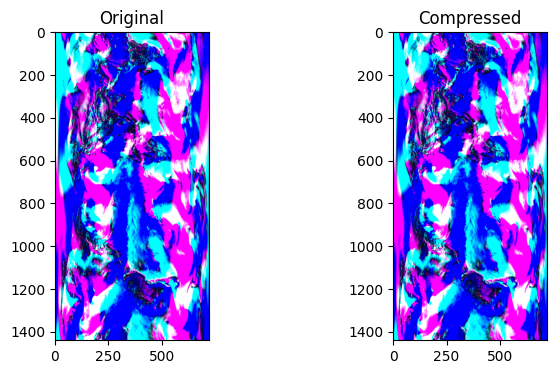

Saturation values per band ('10m_u_component_of_wind', '10m_v_component_of_wind', '10m_wind_speed')):
 [[-3.0264400e+01  3.1166637e+01]
 [-2.9498859e+01  2.8069586e+01]
 [ 3.1417224e-04  3.1332365e+01]]
 - MSE_sat 0.005749 (input saturated)
 - SNR_sat 37.8346 (input saturated)
 - PSNR_sat 52.3236 (input saturated)
 - Exp. SA 0.0190 (input saturated)


ffmpeg version 5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_h_env_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_plac --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnu

relative_humidity: 14622.43Mb -> ['48.30', '144.59', '193.64', '244.81', '80.88']Mb (4.87% of original size, 1.5586 bpppb) in 280.90s
 - params={'c:v': 'libx265', 'preset': 'medium', 'crf': [0], 'x265-params': 'qpmin=0:qpmax=0.001:psy-rd=0:psy-rdoq=0'}
 - Decompression time 24.72s


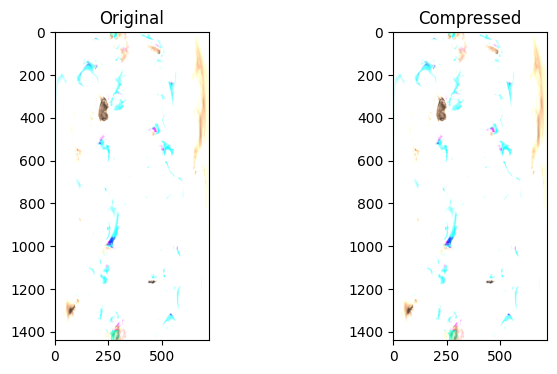

Saturation values per band ['relative_humidity_level_50', 'relative_humidity_level_100', 'relative_humidity_level_150', 'relative_humidity_level_200', 'relative_humidity_level_250', 'relative_humidity_level_300', 'relative_humidity_level_400', 'relative_humidity_level_500', 'relative_humidity_level_600', 'relative_humidity_level_700', 'relative_humidity_level_850', 'relative_humidity_level_925', 'relative_humidity_level_1000', 'relative_humidity_level_1000', 'relative_humidity_level_1000']):
 [[ 3.1670087e-04  6.5330440e-01]
 [-3.2570761e-01  8.3857614e-01]
 [-3.2499504e-01  9.7176421e-01]
 [-1.8608464e-01  9.7753972e-01]
 [-1.0369516e-01  1.1223714e+00]
 [-2.1757485e-01  1.2123638e+00]
 [-9.5167577e-02  1.3183249e+00]
 [-5.0304413e-02  1.3634442e+00]
 [ 1.6063848e-06  1.3512187e+00]
 [ 1.6726511e-06  1.3239648e+00]
 [ 8.1473689e-07  1.5417385e+00]
 [ 8.8096465e-05  1.5696980e+00]
 [ 2.4705571e-03  1.4692402e+00]
 [ 2.4705571e-03  1.4692402e+00]
 [ 2.4705571e-03  1.4692402e+00]]
 - MSE

ffmpeg version 5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_h_env_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_plac --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnu

wind_speed: 14622.43Mb -> ['47.11', '57.03', '74.88', '115.80', '65.12']Mb (2.46% of original size, 0.7877 bpppb) in 231.26s
 - params={'c:v': 'libx265', 'preset': 'medium', 'crf': [0], 'x265-params': 'qpmin=0:qpmax=0.001:psy-rd=0:psy-rdoq=0'}
 - Decompression time 16.79s


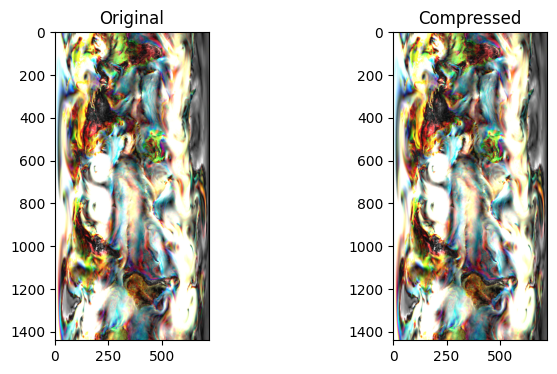

Saturation values per band ['wind_speed_level_50', 'wind_speed_level_100', 'wind_speed_level_150', 'wind_speed_level_200', 'wind_speed_level_250', 'wind_speed_level_300', 'wind_speed_level_400', 'wind_speed_level_500', 'wind_speed_level_600', 'wind_speed_level_700', 'wind_speed_level_850', 'wind_speed_level_925', 'wind_speed_level_1000', 'wind_speed_level_1000', 'wind_speed_level_1000']):
 [[6.5996741e-05 8.3274986e+01]
 [1.6135495e-04 7.9239952e+01]
 [1.9324558e-04 1.0213222e+02]
 [8.9972302e-05 1.1280654e+02]
 [1.0838690e-04 1.1939448e+02]
 [1.5567108e-04 1.0825489e+02]
 [1.3797989e-04 9.3522972e+01]
 [1.6691753e-04 8.0731613e+01]
 [6.7240806e-05 6.9419685e+01]
 [3.0044524e-05 5.9514233e+01]
 [3.4385216e-06 5.5659275e+01]
 [5.4396318e-05 5.1251278e+01]
 [5.6295317e-05 3.4167114e+01]
 [5.6295317e-05 3.4167114e+01]
 [5.6295317e-05 3.4167114e+01]]
 - MSE_sat 0.011185 (input saturated)
 - SNR_sat 45.1055 (input saturated)
 - PSNR_sat 61.0533 (input saturated)
 - Exp. SA 0.0096 (input sat

ffmpeg version 5.1.2 Copyright (c) 2000-2022 the FFmpeg developers
  built with gcc 11.3.0 (conda-forge gcc 11.3.0-19)
  configuration: --prefix=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_h_env_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_placehold_plac --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_build_env/bin/x86_64-conda-linux-gnu-cc --cxx=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_build_env/bin/x86_64-conda-linux-gnu-c++ --nm=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_build_env/bin/x86_64-conda-linux-gnu-nm --ar=/home/conda/feedstock_root/build_artifacts/ffmpeg_1674566204550/_build_env/bin/x86_64-conda-linux-gnu-ar --disable-doc --disable-openssl --enable-demuxer=dash --enable-hardcoded-tables --enable-libfreetype --enable-libfontconfig --enable-libopenh264 --enable-gnu

wind_u: 14622.43Mb -> ['35.58', '41.62', '50.57', '72.29', '40.41']Mb (1.64% of original size, 0.5263 bpppb) in 199.92s
 - params={'c:v': 'libx265', 'preset': 'medium', 'crf': [0], 'x265-params': 'qpmin=0:qpmax=0.001:psy-rd=0:psy-rdoq=0'}
 - Decompression time 14.21s


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.9377768..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-2.9259524..1.0].


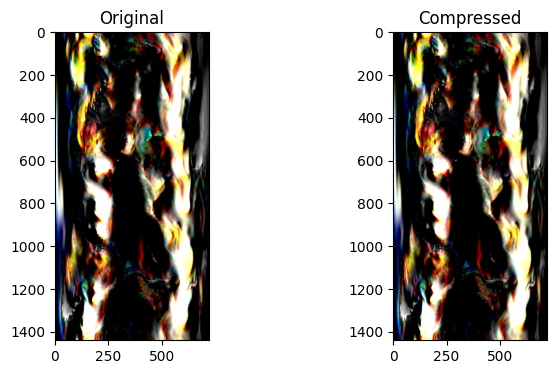

Saturation values per band ['u_component_of_wind_level_50', 'u_component_of_wind_level_100', 'u_component_of_wind_level_150', 'u_component_of_wind_level_200', 'u_component_of_wind_level_250', 'u_component_of_wind_level_300', 'u_component_of_wind_level_400', 'u_component_of_wind_level_500', 'u_component_of_wind_level_600', 'u_component_of_wind_level_700', 'u_component_of_wind_level_850', 'u_component_of_wind_level_925', 'u_component_of_wind_level_1000', 'u_component_of_wind_level_1000', 'u_component_of_wind_level_1000']):
 [[-39.137035  80.58957 ]
 [-53.16208   75.644714]
 [-43.950226 102.12832 ]
 [-50.97888  112.806274]
 [-61.141968 111.19408 ]
 [-64.24279  105.73195 ]
 [-61.511673  89.458954]
 [-51.548626  78.58211 ]
 [-49.23384   66.09289 ]
 [-47.69845   53.201397]
 [-49.89595   49.975876]
 [-50.46102   48.74789 ]
 [-31.699408  32.993694]
 [-31.699408  32.993694]
 [-31.699408  32.993694]]


In [ ]:
arr_dict= xarray2video(era5.sel(time=slice(pd.Timestamp('2022-11-01'), None)), 
                       era5_version.replace('.zarr', ''), conversion_rules,
                       output_path=output_path, use_ssim=False, compute_stats=True,
                       loglevel='verbose', #verbose, quiet
                       save_dataset=False #Disable saving
                       )  

## Testing Cesar's cloudless data

In [ ]:
#Load data
data= np.load('../s2data.npy')
cesar_bands= ['B2', 'B3', 'B4', 'B5', 'B6', 'B7', 'B8', 'B8A', 'B11', 'B12']

#Create the xarray.DataArray
xdata= xr.Dataset(
    {band: ( ['time', 'x', 'y'], data[:,bi] ) for bi,band in enumerate(cesar_bands)},
    coords={
        'time': pd.date_range("2015-09-01", periods=106, freq='M'),
        'x': np.arange(512),
        'y': np.arange(512),
    },
)

xdata= xdata.astype(np.float32) / 10000.
xdata

In [ ]:
lossy_params = {
    'c:v': 'libx265',  #[libx264, libx265, vp9, ffv1]
    'preset': 'medium',  #Preset for quality/encoding speed tradeoff: quick, medium, slow (better)
    'crf': [2],#,1,3,6,9], #14 default, 11 for higher quality and size
    'x265-params': 'qpmin=0:qpmax=8:psy-rd=0:psy-rdoq=0',
    }

conversion_rules= {
    'rgb': (['B4', 'B3', 'B2'], ('time', 'x', 'y'), 0, lossy_params, 12),
    # 'all': (cesar_bands, ('time', 'x', 'y'), 0, lossy_params, 10),
    }

arr_dict= xarray2video(xdata, 'cesar', conversion_rules, fmt='mkv',
                       output_path=output_path, use_ssim=False, compute_stats=True,
                       loglevel='verbose', #verbose, quiet
                       save_dataset=False #Disable saving
                       )  

In [ ]:
new_path= str(Path(output_path) / 'cesar')
!du -h {new_path} 

Read again the written file, and check that everything has persisted

In [ ]:
xdata_new= video2xarray(output_path, 'cesar', fmt='mkv') 
xdata_new

Visualize results

In [ ]:
#RGB
plot_image(xdata, ['B4','B3','B2'], mask_name=None, stack_every=12, save_name='./out/RGB original_cesar.jpg')
plot_image(xdata_new, ['B4','B3','B2'], mask_name=None, stack_every=12, save_name='./out/RGB compressed_cesar.jpg')

## Plot some compression graphs for DeepExtremes

In [ ]:
raise None

In [ ]:
#Remove out folder to avoid errors
!rm -rf ./testing

In [ ]:
#assert False, 'Comment this cell to run. This takes a long time'

#Load libs
from tqdm.notebook import tqdm
import warnings
rng= np.random.default_rng(seed=42)

#Define crfs and tests
tests= ['libx264_slow_ffv1', 'libx265_medium_ffv1', 'vp9_quick_vp9']
#['libx264_slow_ffv1', 'libx265_medium_ffv1', 'vp9_quick_vp9']
#crfs= [-1, 0,1,2,4,7,11,16,22,29]
crfs= [-1,0,1,2,3,4,6,12,20,30]
n_bits= [8,10,12]
use_ssim= False

#Take N random cubes
dataset_in_path= Path('./') #Path('/scratch/users/deepextremes/deepextremes-minicubes/full')
cube_paths= np.array(list(dataset_in_path.glob('*.zarr'))) #'*/*.zarr'
rng.shuffle(cube_paths)
cube_paths= cube_paths[:10]

#Run
overall_results={}
for input_path in (pbar:=tqdm(cube_paths, total=len(cube_paths))):
    #Create cube id
    array_id= '_'.join(input_path.stem.split('_')[1:3])
    overall_results[array_id]= {}

    #Load
    minicube= xr.open_dataset(input_path, engine='zarr')
    minicube['SCL']= minicube['SCL'].astype(np.uint8) #Fixes problem with the dataset
    minicube['cloudmask_en']= minicube['cloudmask_en'].astype(np.uint8)
    minicube= minicube.drop_vars('B07') #We drop a variable for now

    #Align
    bands= ['B04','B03','B02','B8A','B06','B05']
    minicube[bands]= minicube[bands].isel(time=slice(74*2,None)) #Frist two years have too much missing data
    reference_image= minicube[bands].mean("time").to_array().transpose('variable', 'y', 'x')
    datacube= minicube[bands].to_array().transpose('time', 'variable', 'y', 'x')
    with warnings.catch_warnings(): 
        warnings.simplefilter("ignore")
        syncmodel= satalign.PCC( #PCC quicker, ECC more precise
            datacube=datacube, # T x C x H x W
            reference=reference_image, # C x H x W
            channel="mean", crop_center=96, num_threads=1)
        new_cube, warps= syncmodel.run_multicore()
        for b in bands: minicube[b]= new_cube.sel(variable=b)

    for test in tests:
        overall_results[array_id][test]= {}
        for crf in crfs:
            overall_results[array_id][test][crf]= {}
            for bits in n_bits:
                #Update pbar
                pbar.set_description(f'{test=} | {array_id=} | {crf=} | {bits=}')

                #Set up parameters
                codec_lossy, preset, codec_lossless= test.split('_')
                lossless= {
                    'c:v': codec_lossless,
                    'preset': preset, 
                    'lossless': 1, #Only for vp9
                    } 
                lossy = {
                    'c:v': codec_lossy,  #[libx264, libx265, vp9, ffv1]
                    'preset': preset,  #Preset for quality/encoding speed tradeoff: quick, medium, slow (better)
                    'crf': crf, #11 default, the lower the higher the quality
                    }
                if codec_lossless == 'vp9': #vp9 can do lossless compression
                    lossless_params= lossy_params

                conversion_rules= {
                    # 'r': ( 'B04', ('time','x','y'), 'lossy'), #1 channel + lossy not working
                    # 'ir4': ( ('B8A','B07','B06','B05'), ('time','x','y'), 'lossy'), #4 channels not working
                    'rgb': ( ('B04','B03','B02'), ('time','x','y'), False, lossy if crf>=0 else lossless, bits),
                    'ir3': ( ('B8A','B06','B05'), ('time','x','y'), False, lossy if crf>=0 else lossless, bits),
                    }

                try:
                    #Run with compute_stats (takes a bit longer). Activating `use_ssim` takes even longer
                    results= xarray2video(minicube, array_id, conversion_rules, fmt='mkv',
                                           output_path=Path('./testing/'), use_ssim=use_ssim, compute_stats=True,
                                           loglevel='quiet',#verbose, quiet
                                           verbose=False, 
                                           )
                    overall_results[array_id][test][crf][bits]= results
                    
                    #Delete files
                    for file in [results['path']] + \
                                [v1 for v in conversion_rules.keys() for v1 in results[v]['path']]:
                        file.unlink()

                except Exception as e:
                    print(f'{test=} | {array_id=} | {crf=} | {bits=}: Exception: {e}')
                    #overall_results[array_id][test][crf][bits]= None

Process the results into a pandas dataframe

In [ ]:
import pandas as pd
import seaborn as sns

#Reset matplotlib config and change defaults
import matplotlib.ticker as mtick
import matplotlib.pyplot as plt, matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)    
plt.style.use('ggplot')
mpl.rcParams.update({'font.size': 10})

#We will create a dict only with metric values and convert it to pandas with multiindex
results_metrics={}
metrics_keep= ['compression', 'snr', 'psnr', 'mse', 'bpppb', 'exp_sa', 'time', 'd_time']\
              + (['ssim'] if use_ssim else [])
for cube, cube_results in overall_results.items():
    #if cube not in ['_'.join(p.stem.split('_')[1:3]) for p in cube_paths]: continue
    for test, test_results in cube_results.items():
        for crf, crf_results in test_results.items():
            for bits, bits_results in crf_results.items():
                for video_name, metadata in bits_results.items():
                    if isinstance(metadata, dict): #Ignore 'path'
                        for metric in metrics_keep:
                            results_metrics[(metric, video_name, test, bits, cube, crf)]= metadata[metric]
results_df = pd.DataFrame.from_dict(results_metrics, orient='index', columns=['value'])
results_df.index = pd.MultiIndex.from_tuples(results_df.index)
results_df.index.names = ['metric', 'video_name', 'test_name', 'bits', 'cube', 'crf']
results_df.to_pickle('results2.pkl')

Plot them!

In [ ]:
#Now plot it! 
#Colors?
# cmap= plt.get_cmap('gist_rainbow')
# colors= [cmap(value) for value in np.linspace(0, 1, 15)] #0->1, 15 values
cmap= plt.get_cmap('tab10')
colors= [cmap(value) for value in [*np.linspace(0, 1, 9)]*2] #0->1, 12 values

#Load results?
# results_df= pd.read_pickle('results_h264_h265.pkl')
# results_df= pd.read_pickle('results_10bit.pkl')
# results_df= pd.read_pickle('results_12bit.pkl')
# results_df= pd.read_pickle('results_allbits.pkl')

# x_label= 'Compression percentage' #One of {'Compression percentage', 'Compression factor', 'bpppb'}
x_label= 'bpppb'
c_index= 0 #Color index, go through the colormap
metrics_plot= {'psnr':'PSNR (dB)', 'snr':'SNR (dB)', 'mse':'MSE',
               'ssim':'SSIM', 'exp_sa':'SA (radians)', 
               'time': 'Compression time (s)', 'd_time': 'Decompression time (s)'}
metrics_plot= {m:label for m, label in metrics_plot.items() if m in metrics_keep}
f, axes= plt.subplots(len(metrics_plot),1, figsize=(7*2,12*2))
for i, ((metric, ylabel), ax) in enumerate(zip(metrics_plot.items(), axes.flatten())):
    ax.set_ylabel(ylabel)
    c_index= 0

    if x_label == 'Compression factor':
        #If using a factor for compression
        ax.set_xscale('log')
        ax.xaxis.set_major_formatter(mtick.ScalarFormatter())
        ax.xaxis.set_minor_formatter(mtick.ScalarFormatter())
        ax.tick_params(axis='x', which='minor', labelsize=6) 
    elif x_label == 'Compression percentage':
        #If using percentage for compression
        ax.xaxis.set_major_formatter(mtick.PercentFormatter())
        start, end = ax.get_xlim()
    elif x_label == 'bpppb':
        ax.set_xscale('log')
        ax.xaxis.set_major_formatter(mtick.FormatStrFormatter('%.2f'))
        ax.xaxis.set_minor_formatter(mtick.FormatStrFormatter('%.2f'))
        ax.tick_params(axis='x', which='minor', labelsize=6) 
    else:
        raise AssertionError(f'Unknown {x_label=}')

    for i_video, video in enumerate(conversion_rules.keys()):
        for bits in n_bits:
            for test in tests:
                try:
                    data= results_df.xs(test, level='test_name').xs(video, level='video_name').xs(bits, level='bits')
                    metric_values= data.xs(metric, level='metric').values.flatten()
                    if x_label == 'Compression factor':
                        compression_values= 1/data.xs('compression', level='metric').values.flatten()
                    elif x_label == 'Compression percentage':
                        compression_values= data.xs('compression', level='metric').values.flatten()
                    elif x_label == 'bpppb':
                        compression_values= data.xs('bpppb', level='metric').values.flatten()
                    else:
                        raise AssertionError(f'Unknown {x_label=}')
                    scatter_kws= {'s': 5, 'alpha': 0.25}
                    line_kws= {'linestyle': ['-', '--', ':', '-.'][i_video], 'label':f'{video} {bits}bits {test}'}
                    sns.regplot(x=compression_values * (100 if x_label == 'Compression percentage' else 1), 
                                y=metric_values, ax=ax, 
                                lowess=True, color=colors[c_index], 
                                scatter_kws=scatter_kws, line_kws=line_kws, 
                                marker=['o', '*', 'D', '^', '*'][i_video] #Overwrites scatter_kws
                               ) 
                    c_index+= 1
                except Exception as e:
                    print(f'Error processing {test=}, {video=}, {metric=}, {bits=}: {e}')

    # if metric not in ['time']: 
    #     ax.axhline(metric_values[0], color='darkred', linestyle='--', label='uint8 discretization limit')
    if i==0: ax.legend(ncol=2)
        
ax.set_xlabel(x_label)
plt.savefig(f'results_{x_label.lower().replace(" ","_")}.png', dpi=200, bbox_inches='tight')
plt.show()